In [309]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet,ElasticNetCV,LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score,confusion_matrix, roc_curve,roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import pickle

In [310]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [311]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [312]:
#outcome as label column - diabetic or not - binary class classification hai 

In [313]:
#EDA - how data is related to each other 

In [314]:
# ProfileReport(df)

In [315]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [316]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [317]:
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


In [318]:
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [319]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [320]:
#it shows 111 as zeroes in pregnancies that means 111 jagah pe zeros value written hai 
# standard deviation is 3. something s-- it may be normally distributed and if standard deviation=1 then that means it is 
# standard normally distributed.
#dont have to see correlation graph as we are not doing linear regression
#correlation graph shows whether the data set is highly correlated in between or not-- multicolinearity have to remove the columns
# vif -- 1/1-r2 >10 -- variables r highly colinear to each other
#in graph pearson correlation -- it doesnt seem anything extreme - no multicolinearity
#no null values-nan/missing values 
#dataset is skewed #high amount of zeros available in dataset -- info is either not captured or failure of measuring device
#update columns by their mean

In [321]:
df["BMI"] = df["BMI"].replace(0,df["BMI"].mean())
#take the mean of the bmi column and replcae all the zeros by its mean value

In [322]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [323]:
df[["BMI"]]

,BMI
0,33.6
1,26.6
2,23.3
3,28.1
4,43.1
...,...
763,32.9
764,36.8
765,26.2
766,30.1


In [324]:
df.columns
#pregnacies can have 0 values

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [325]:
df["BloodPressure"] = df["BloodPressure"].replace(0,df["BloodPressure"].mean())

In [326]:
df["Glucose"] = df["Glucose"].replace(0,df["Glucose"].mean())

In [327]:
df["Insulin"] = df["Insulin"].replace(0,df["Insulin"].mean())

In [328]:
df["Insulin"]

0       79.799479
1       79.799479
2       79.799479
3       94.000000
4      168.000000
          ...    
763    180.000000
764     79.799479
765    112.000000
766     79.799479
767     79.799479
Name: Insulin, Length: 768, dtype: float64

In [329]:
df["SkinThickness"] = df["SkinThickness"].replace(0,df["SkinThickness"].mean())
#data is skewed so replace 0 by mean not mode or median

In [330]:
# ProfileReport(df)

In [331]:
#OUTLIERS - ki wajah se  skewed result hoga -- if there's skeweness in the data that means there are outliers.
#if there's no skeweness in the data -- there's no outlier

In [332]:
import matplotlib.pyplot as plt

<AxesSubplot:>

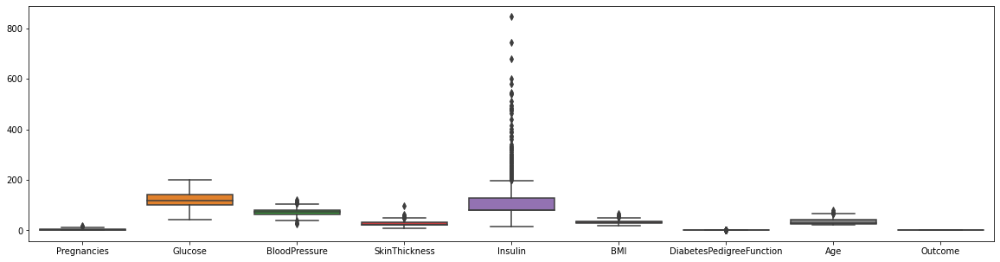

In [333]:
fig,ax = plt.subplots(figsize= (20,5)) #x,y
sns.boxplot(data=df,ax= ax )

In [334]:
#no outliers for glucose , insulin has,pregrancices has outliers
#remove certain percent of data -- 

In [335]:
q= df["Insulin"].quantile(0.95) #dividing insulin column into 95% part and it gives the value which does that.
#we are trying to remove 5% and keeping 95% percent here

In [336]:
#applying the filtering operation in data frame
#applying logical operator on column values to filter rows 
df_new = df[df["Insulin"]< q]

In [337]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

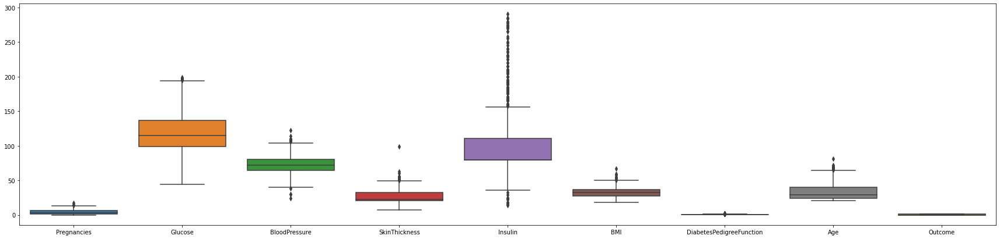

In [338]:
import seaborn as sn
fig,ax = plt.subplots(figsize = (30,7))
sn.boxplot(data=df_new,ax=ax)

In [339]:
q= df["Insulin"].quantile(0.90) #10% data in Insulin column , I'm trying to reject

In [340]:
df_new = df[df["Insulin"]< q]

<AxesSubplot:>

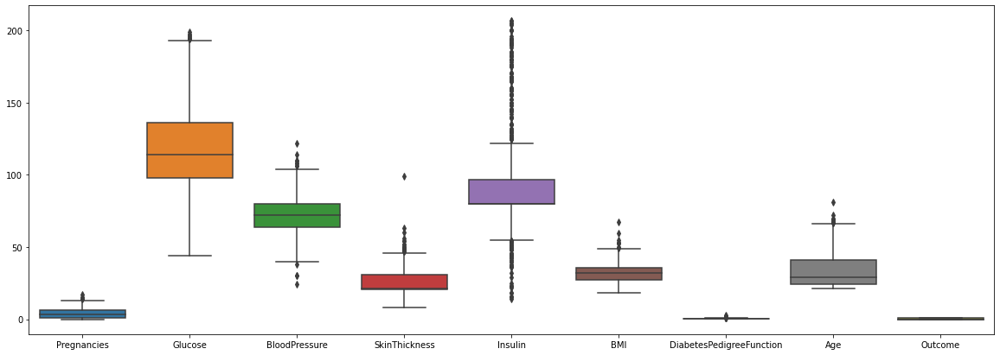

In [341]:
import seaborn as sn
fig,ax = plt.subplots(figsize = (20,7))
sn.boxplot(data= df_new, ax=ax)

In [342]:
df_new # remove rows/records in this 

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [343]:
q = df["Insulin"].quantile(0.70)

In [344]:
df_new= df[df["Insulin"]<q]

In [345]:
df_new #768-536=232 which is 30% of 768 -- this much data iis lost

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
761,9,170.0,74.0,31.000000,79.799479,44.0,0.403,43,1
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

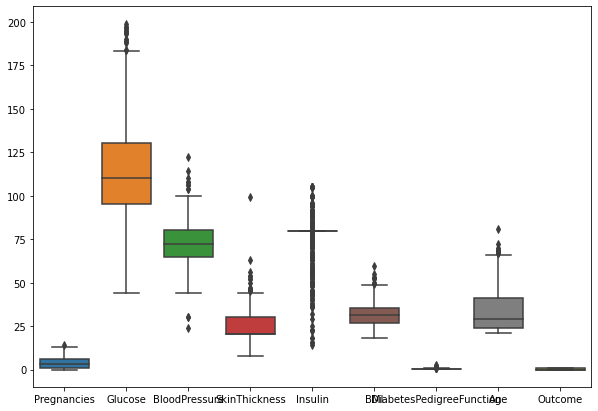

In [346]:
fig,ax = plt.subplots(figsize=(10,7))
sn.boxplot(data=df_new, ax= ax) #shows glucose has outliers 

In [347]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [348]:
q= df["Pregnancies"].quantile(0.98) #keepiing 98% of dataset and losing 2%
df_newP = df[df["Pregnancies"]< q]

In [349]:
df_newP

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

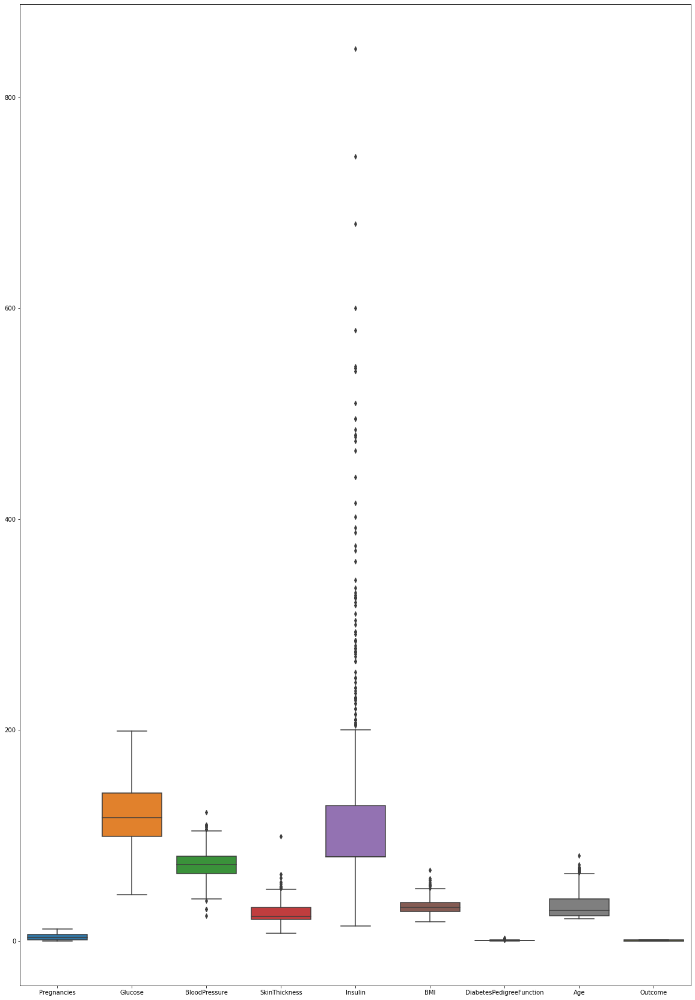

In [350]:
fig,ax = plt.subplots(figsize=(20,30))
sns.boxplot(data= df_newP, ax= ax) #removed outliers from pregrnacy

In [351]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [352]:
q = df["BMI"].quantile(0.99)

In [353]:
df_newB = df_newP[df_newP["BMI"]<q]

<AxesSubplot:>

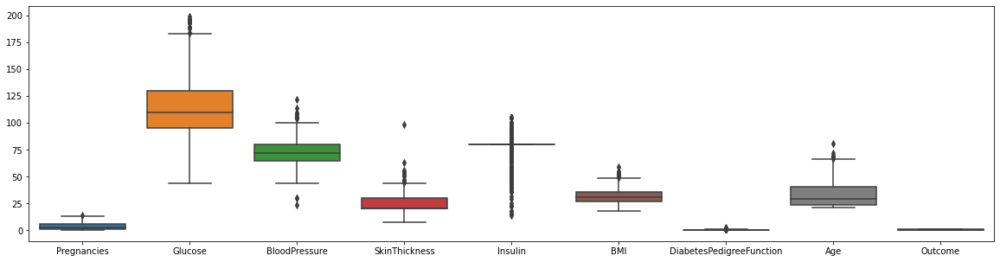

In [354]:
fig,ax = plt.subplots(figsize=(20,5))
sns.boxplot(data=df_new, ax=ax)
#it is getting affected because other columns are also losing some data -- isliye we can see for other columns as wel 
# that they are getting affected

In [355]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [356]:
q= df["SkinThickness"].quantile(0.99)
df_newB = df_newB[df_newB["SkinThickness"] < q]

<AxesSubplot:>

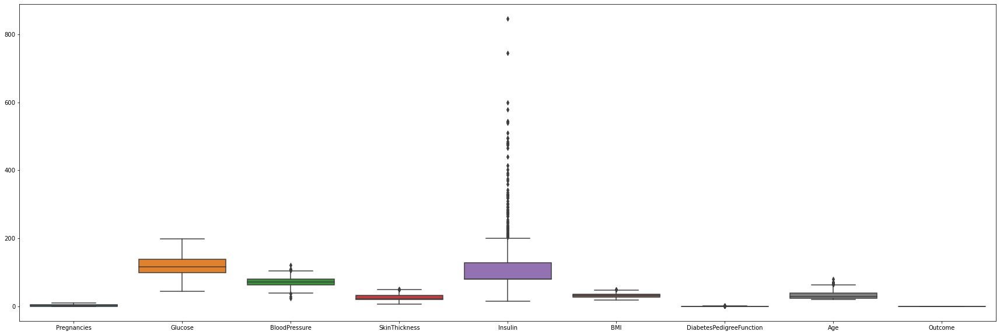

In [357]:
fig,ax = plt.subplots(figsize = (30,10))
sns.boxplot(data=df_newB,ax =ax)

In [358]:
df_newB

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [359]:
q= df["Insulin"].quantile(0.99)
df_new = df_new[df_new["Insulin"] < q]

<AxesSubplot:>

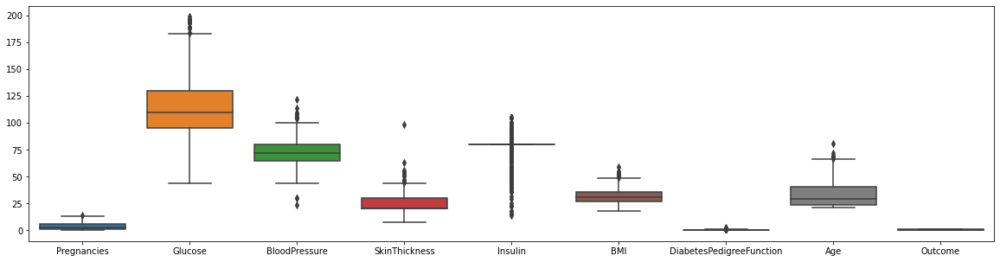

In [360]:
fig,ax = plt.subplots(figsize=(20,5))
sns.boxplot(data=df_new,ax=ax)

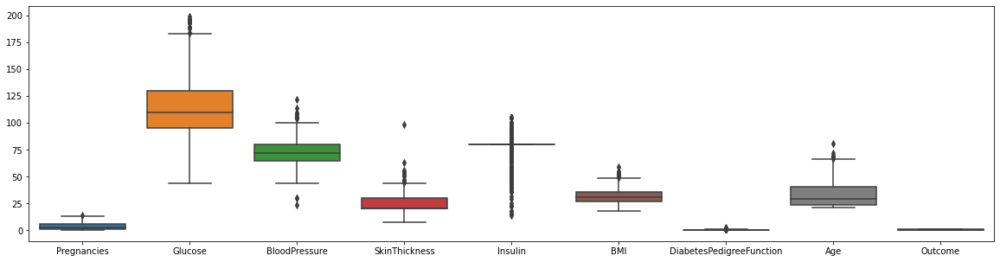

In [361]:
fig


In [362]:
ax

<AxesSubplot:>

In [363]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [364]:
q= df["DiabetesPedigreeFunction"].quantile()

In [365]:
q= df["Pregnancies"].quantile(0.98)
df_new= df[df["Pregnancies"]<q]


In [366]:
q= df_new["BMI"].quantile(0.99)
df_new = df_new[df_new["BMI"]< q]

In [367]:
q= df_new["SkinThickness"].quantile(0.99)
df_new =df_new[df_new["SkinThickness"]<q]

In [368]:
q= df_new["Insulin"].quantile(0.95)
df_new =df_new[df_new["Insulin"]<q]

In [369]:
q= df_new["DiabetesPedigreeFunction"].quantile(0.95)
df_new = df_new[df_new["DiabetesPedigreeFunction"] < q]

In [370]:
q= df["Pregnancies"].quantile(0.98)
df_new= df[df["Pregnancies"]<q]

q= df_new["BMI"].quantile(0.99)
df_new = df_new[df_new["BMI"]< q]

q= df_new["SkinThickness"].quantile(0.99)
df_new =df_new[df_new["SkinThickness"]<q]

q= df_new["Insulin"].quantile(0.95)
df_new =df_new[df_new["Insulin"]<q]

q= df_new["DiabetesPedigreeFunction"].quantile(0.99)
df_new = df_new[df_new["DiabetesPedigreeFunction"] < q]



In [371]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

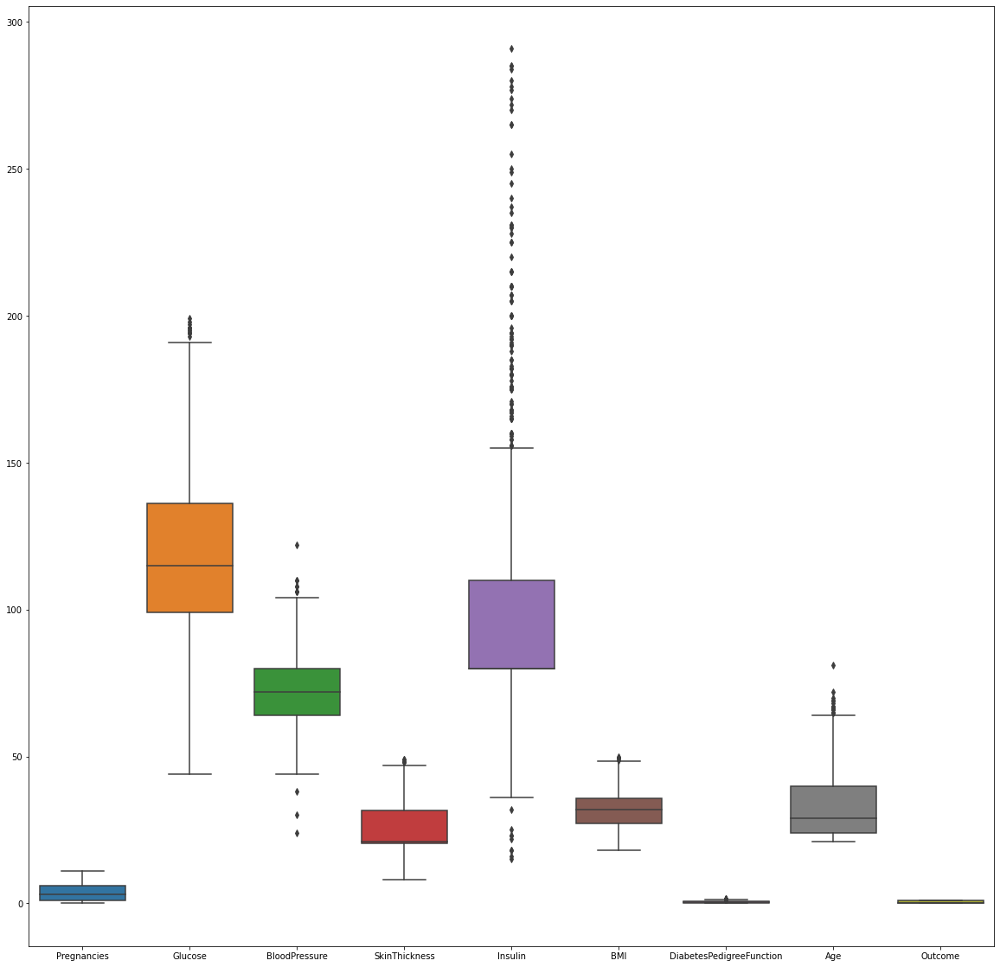

In [372]:
fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax=ax)

In [373]:
q = df_new["Age"].quantile(0.99)
df_new = df_new[df_new["Age"] < q]

<AxesSubplot:>

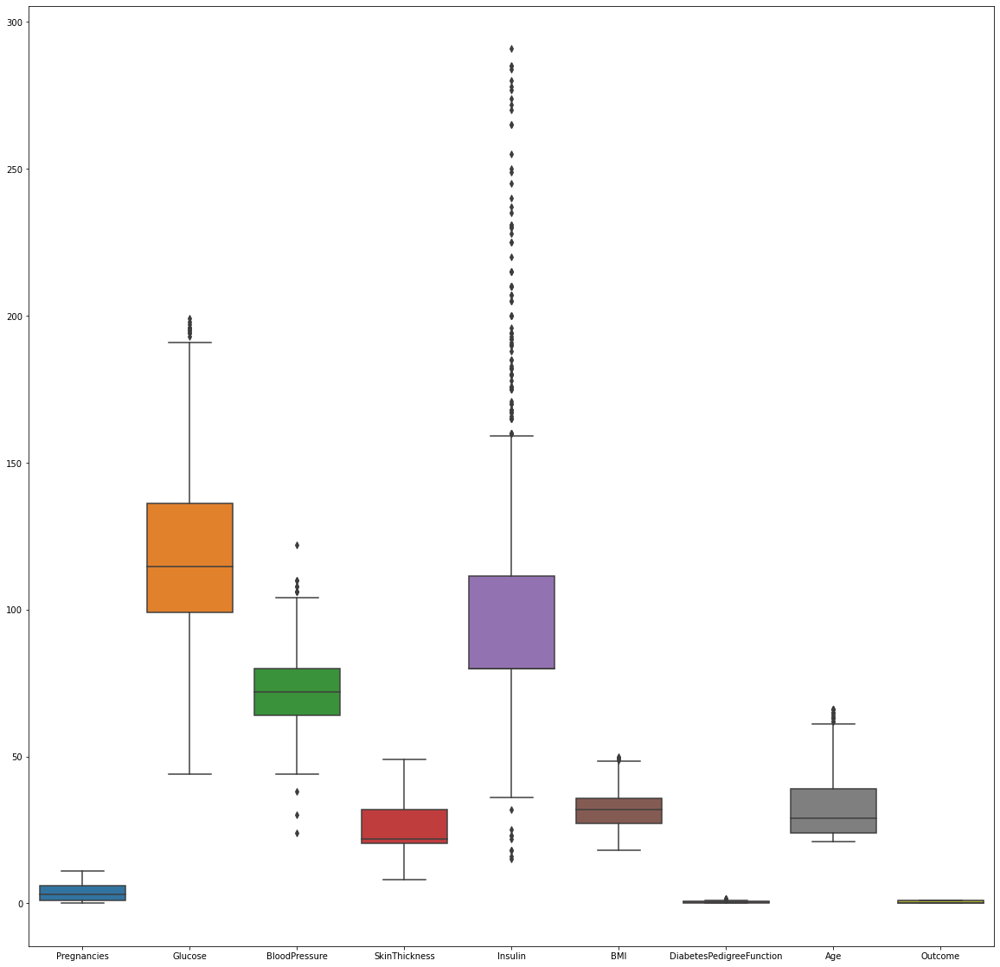

In [374]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data = df_new, ax= ax)

In [375]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [376]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [377]:
y = df_new["Outcome"]

In [378]:
x= df_new.drop(columns= ["Outcome"])

In [379]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [380]:
#glucose is varying between huge ranges 
#even for insulin - varying betweenbhigh ranges -- between certain ranges is fluctuating
#dataset is varying in different scales 
#call standard scaling - to remove thses fluctuations 

In [381]:
from sklearn.preprocessing import StandardScaler

In [382]:
scalar = StandardScaler() 
#preparing an object under standardscaler #scaling pura datset pe laga hai 
#In standardscaling we are trying to transform our dataset in a different scale 
#there is no data leakage standard deviation = 1 mean = 0- normalisation 
#standard scaling will normalisee -- it wont give yoou a very skwed data now


In [383]:
arr= scalar.fit_transform(x) #scaled dataset #you always scale just x - never y

In [384]:
from pandas_profiling import ProfileReport

In [385]:
ProfileReport(pd.DataFrame(arr)) #ProfileReport takes the dataframe as the input

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [386]:
#now drawing a graph to see that after standard scaling -- whts the impact on the outliers

<AxesSubplot:>

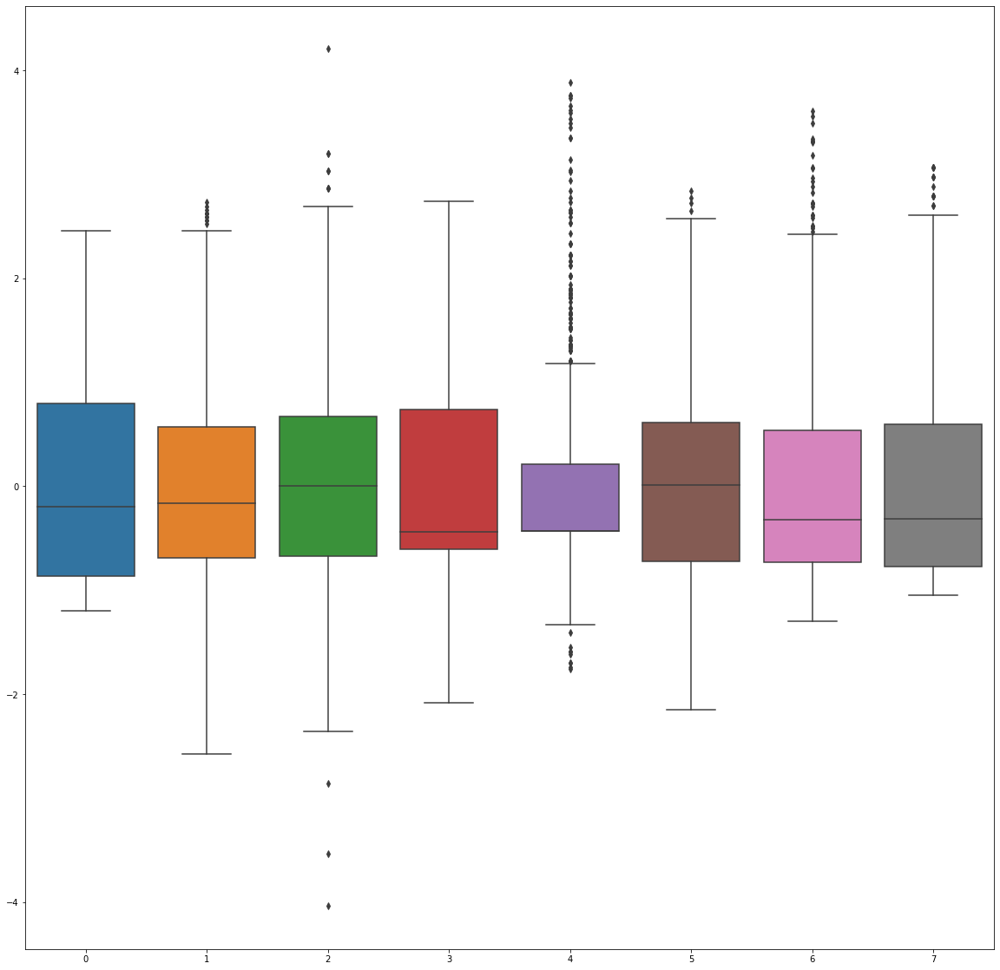

In [387]:
df_new_scalar = pd.DataFrame(scalar.fit_transform(x))
fig,ax = plt.subplots(figsize= (20,20))
sns.boxplot(data= df_new_scalar,ax= ax)
#dispersion and the variance has changed , dataset is dispersed equally now between a similar scale 
#as all the boxes are coming on the same scale ie between all the boxes are between -2 to 2 
#if outliers are scattered and very less - in that case outlier treatment isnt required.


In [388]:
arr

array([[ 7.96753910e-01,  9.83984062e-01,  4.52611463e-04, ...,
         2.65819648e-01,  6.30484542e-01,  1.60141519e+00],
       [-8.64793539e-01, -1.16977621e+00, -5.04474494e-01, ...,
        -8.31445036e-01, -3.38078670e-01, -1.32706484e-01],
       [ 1.46137289e+00,  2.18051755e+00, -6.72783529e-01, ...,
        -1.34872696e+00,  7.88402456e-01, -4.14369227e-02],
       ...,
       [ 4.64444420e-01,  6.09439465e-02,  4.52611463e-04, ...,
        -8.94145875e-01, -7.10063091e-01, -2.23976046e-01],
       [-8.64793539e-01,  2.31877301e-01, -1.00940160e+00, ...,
        -2.82812694e-01, -3.45097244e-01,  1.32760650e+00],
       [-8.64793539e-01, -8.96282840e-01, -1.67856424e-01, ...,
        -2.35787064e-01, -4.64413001e-01, -8.62862978e-01]])

In [389]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

In [390]:
#Variance_inflation_factor -- vif score to find multicolinearity

In [391]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

In [392]:
arr

array([[ 7.96753910e-01,  9.83984062e-01,  4.52611463e-04, ...,
         2.65819648e-01,  6.30484542e-01,  1.60141519e+00],
       [-8.64793539e-01, -1.16977621e+00, -5.04474494e-01, ...,
        -8.31445036e-01, -3.38078670e-01, -1.32706484e-01],
       [ 1.46137289e+00,  2.18051755e+00, -6.72783529e-01, ...,
        -1.34872696e+00,  7.88402456e-01, -4.14369227e-02],
       ...,
       [ 4.64444420e-01,  6.09439465e-02,  4.52611463e-04, ...,
        -8.94145875e-01, -7.10063091e-01, -2.23976046e-01],
       [-8.64793539e-01,  2.31877301e-01, -1.00940160e+00, ...,
        -2.82812694e-01, -3.45097244e-01,  1.32760650e+00],
       [-8.64793539e-01, -8.96282840e-01, -1.67856424e-01, ...,
        -2.35787064e-01, -4.64413001e-01, -8.62862978e-01]])

In [393]:
arr.shape

(674, 8)

In [394]:
arr.shape[0]

674

In [395]:
arr.shape[1]

8

In [396]:
range(arr.shape[1])

range(0, 8)

In [397]:
for i in range(arr.shape[1]):
    print(variance_inflation_factor(arr,i))

1.4490563069444333
1.304263166706458
1.2626856993376134
1.4700489723100498
1.2710166390932485
1.5131595916538998
1.0423002435997526
1.6627283099333732


In [398]:
vif_df = pd.DataFrame() #empty dataframe 

In [399]:
vif_df["vif"] = [variance_inflation_factor(arr,i) for i in range(arr.shape[1])]


In [400]:
[variance_inflation_factor(arr,i) for i in range(arr.shape[1])]

[1.4490563069444333,
 1.304263166706458,
 1.2626856993376134,
 1.4700489723100498,
 1.2710166390932485,
 1.5131595916538998,
 1.0423002435997526,
 1.6627283099333732]

In [401]:
vif_df

,vif
0,1.449056
1,1.304263
2,1.262686
3,1.470049
4,1.271017
5,1.513160
6,1.042300
7,1.662728


In [402]:
vif_df["features"] = x.columns

In [403]:
x.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [404]:
vif_df

,vif,features
0,1.449056,Pregnancies
1,1.304263,Glucose
2,1.262686,BloodPressure
3,1.470049,SkinThickness
4,1.271017,Insulin
5,1.513160,BMI
6,1.042300,DiabetesPedigreeFunction
7,1.662728,Age


In [406]:
[(x.columns[i],variance_inflation_factor(arr,i)) for i in range(arr.shape[1])]

[('Pregnancies', 1.4490563069444333),
 ('Glucose', 1.304263166706458),
 ('BloodPressure', 1.2626856993376134),
 ('SkinThickness', 1.4700489723100498),
 ('Insulin', 1.2710166390932485),
 ('BMI', 1.5131595916538998),
 ('DiabetesPedigreeFunction', 1.0423002435997526),
 ('Age', 1.6627283099333732)]

In [409]:
df1

,features,VIF
0,Pregnancies,1.448029
1,Glucose,1.303358
2,BloodPressure,1.250515
3,SkinThickness,1.455101
4,Insulin,1.277119
5,BMI,1.495008
6,DiabetesPedigreeFunction,1.042501
7,Age,1.654461


In [410]:
def vif_score(x): #x is the features columns
    scalar = StandardScaler() #creating an object of standardscalar
    arr = scalar.fit_transform(x)#x jo feature wala data hai usko we are normalising
    return pd.DataFrame([[x.columns[i],variance_inflation_factor(arr, i)] for i in range(arr.shape[1])], 
                          columns = ["features","vif_score"])

In [411]:
vif_score(x)

,features,vif_score
0,Pregnancies,1.449056
1,Glucose,1.304263
2,BloodPressure,1.262686
3,SkinThickness,1.470049
4,Insulin,1.271017
5,BMI,1.513160
6,DiabetesPedigreeFunction,1.042300
7,Age,1.662728


In [412]:
# we dont have multicolinearity -- dont remove colums -- vif should be greater than 10
#1/1-r2  ---- its going to consider 90%
#dont remove/drop columns 

In [413]:
x.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [414]:
x.columns[1]

'Glucose'

In [415]:
#train_test_split
from sklearn.model_selection import train_test_split

In [416]:
x_train,x_test,y_train,y_test=train_test_split(arr,y, test_size = 0.20, random_state=144)

In [417]:
#these two samples are taken from the same population which is fluctuating in between same variances because we applied standard scalar 
# on samee datatset 
x_test

array([[ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, ...,
        -4.70915211e-01, -2.50346495e-01,  1.23633694e+00],
       [-1.19710303e+00,  6.76304024e-01, -8.41092564e-01, ...,
        -1.53682948e+00, -8.43415997e-01, -1.04540210e+00],
       [ 2.45830136e+00,  8.13050708e-01,  1.85185200e+00, ...,
         7.36075942e-01, -6.78479508e-01,  1.69268475e+00],
       ...,
       [ 7.96753910e-01, -5.54416131e-01, -5.04474494e-01, ...,
        -1.19197486e+00, -6.96025943e-01, -3.15245608e-01],
       [-5.32484049e-01, -1.20396288e+00, -2.43135269e-01, ...,
         1.38528976e-02, -5.03015158e-01, -1.04540210e+00],
       [-8.64793539e-01, -1.64838960e+00, -2.01925581e+00, ...,
        -1.80330804e+00, -4.36338705e-01, -9.54132539e-01]])

In [418]:
x_train

array([[-0.86479354,  0.19769063, -1.85094678, ...,  0.21879402,
         1.80609569, -0.40651517],
       [ 2.45830136,  1.22329076,  0.33707068, ...,  0.21879402,
         3.1782269 ,  1.69268475],
       [ 0.13213493,  0.91561072,  1.09446134, ..., -0.47091521,
        -0.90658316, -0.49778473],
       ...,
       [-0.86479354, -0.28092276,  1.17861586, ..., -0.28281269,
        -1.06801036, -0.86286298],
       [ 1.46137289,  0.02675728,  0.50537972, ..., -1.08224839,
        -0.13454002,  2.87918905],
       [-0.86479354, -0.75953616, -0.33616546, ..., -0.73739378,
         2.27283086, -0.95413254]])

In [419]:
#build a model
logr = LogisticRegression()#regularisation is applied by default in logistic regresssion  and we use different-2 solvers
#logr is the object of the logisticregression 

In [420]:
logr = LogisticRegression(verbose=1)
logr

LogisticRegression(verbose=1)

In [421]:
logr.fit(x_train,y_train) #fit wale mein hamesha train dataset hoga

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [422]:
x_test[0]

array([ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, -6.09921498e-01,
       -4.34192020e-01, -4.70915211e-01, -2.50346495e-01,  1.23633694e+00])

In [424]:
logr.predict([x_test[0]]) 
#we can tell which class this dataset belongs to
#outcome = 0 means classees= 0 -- this is the prediction that we got 
#this is the predicted y 

array([0], dtype=int64)

In [425]:
logr.predict_proba([x_test[0]]) 
#here we can know prediction probabaility
#prob that x_test[0]- this dataset belongs to class 0 is 0.5 and the prob that it belongs to class 1 is 0.4
#we had binary class so class 0 what is the prob and for class 1 what is the probability 
#this is the predicted y probabaility 

array([[0.83549024, 0.16450976]])

In [426]:
logr.predict_log_proba([x_test[0]]) 
#this is logit ie. log(p/1-p)
#it telss whether it is this side or that side of the line
#-0.5 is greater than - this prob is greater than -0.8 --

array([[-0.17973662, -1.80478536]])

In [427]:
type(y_test) #series
#y_test[0] - this doesnt work in series, this works in dataframe and arrays

pandas.core.series.Series

In [428]:
y_test.iloc[0] #0th index pe kya value hai
#actual class was 1


1

In [429]:
#now checking the y prediction and y actual for the 1st record of x_test
logr.predict([x_test[1]]) #it shows that the first record of x_test belongs to the 0th class -- this is y predicted 


array([0], dtype=int64)

In [430]:
logr.predict_proba([x_test[1]]) #finding the prob of each outcome ki class
#prediction probability for these two classes 

array([[0.91629065, 0.08370935]])

In [431]:
logr.predict_log_proba([x_test[1]]) #finding the logit function

array([[-0.08742167, -2.48040456]])

In [432]:
y_test

406    1
511    0
24     1
751    0
689    1
      ..
3      0
469    0
587    0
60     0
97     0
Name: Outcome, Length: 135, dtype: int64

In [433]:
y_test.iloc[1] #wrong prediction hua 

0

In [434]:
#######comparing two logistic regression model -- one with liblinear, the other with lbfs solver #########
#we have two models using two different solvers 
#out of these two models i gotta select the best one 

In [435]:
logr_liblinear = LogisticRegression(verbose=1, solver= "liblinear") #one model using solver as liblinear
logr_liblinear #creatiing the object of this logistic regression

LogisticRegression(solver='liblinear', verbose=1)

In [436]:
logr_liblinear.fit(x_train,y_train) # fit

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [437]:
y_pred_liblinear = logr_liblinear.predict(x_test)
y_pred_liblinear

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [438]:
logr = LogisticRegression(verbose = 1) #creating an object out of default 
logr

LogisticRegression(verbose=1)

In [439]:
logr.fit(x_train,y_train)#one model #fitted that model 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [440]:
y_pred_default = logr.predict(x_test)
y_pred_default

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [441]:
#finding accuarcy 
#befroe finding roc and auc find confusion matrix


In [442]:
from sklearn.metrics import confusion_matrix

In [443]:
#confusion matrix is between actual y and predicted y 
# actual y is y_test and predicted y is y_pred
confusion_matrix(y_test,y_pred_default)

array([[77, 10],
       [24, 24]], dtype=int64)

In [444]:
confusion_matrix(y_test, y_pred_liblinear)

array([[77, 10],
       [24, 24]], dtype=int64)

In [445]:
#both confusion matrixes are same 

In [446]:
confusion_matrix(y_test,y_pred_default).ravel()
#truepositive, falsepositive,falsenegative,trueneagtive
#tp,fp,fn,tn

array([77, 10, 24, 24], dtype=int64)

In [447]:
def model_eval(a,b):
    tp,fp,fn,tn= confusion_matrix(a,b).ravel()
    accuracy = (tp+tn)/(tp+fp+fn+tn)
    recall = tp/(tp+fn)
    precision= tp/(tp+fp)
    specificity = tn/(tn+fp)
    F1score = 2*(precision*recall)/(precision+recall)
    dic ={"A":accuracy,"R":recall,"P":precision,"S":specificity,"f1":F1score}
    return(dic)


In [448]:
model_eval(y_test,y_pred_default)
#accuracy = 78%-- should be between 0 and 1

{'A': 0.7481481481481481,
 'R': 0.7623762376237624,
 'P': 0.8850574712643678,
 'S': 0.7058823529411765,
 'f1': 0.8191489361702128}

In [449]:
model_eval(y_test,y_pred_liblinear)

{'A': 0.7481481481481481,
 'R': 0.7623762376237624,
 'P': 0.8850574712643678,
 'S': 0.7058823529411765,
 'f1': 0.8191489361702128}

In [450]:
#both are same accuracy 

In [451]:
from sklearn.metrics import roc_auc_score

In [452]:
auc1= roc_auc_score(y_test,y_pred_default)
auc1

0.692528735632184

In [453]:
auc2=roc_auc_score(y_test,y_pred_liblinear)

In [454]:
roc_curve(y_test,y_pred_default)

(array([0.        , 0.11494253, 1.        ]),
 array([0. , 0.5, 1. ]),
 array([2, 1, 0], dtype=int64))

In [455]:
fpr1,tpr1,threshold1=roc_curve(y_test,y_pred_default)
#fpr,tpr and threshold
fpr1,tpr1,threshold1
#har ek threshold pe it gives different fpr and tpr

(array([0.        , 0.11494253, 1.        ]),
 array([0. , 0.5, 1. ]),
 array([2, 1, 0], dtype=int64))

In [456]:
fpr2,tpr2,threshold2=roc_curve(y_test,y_pred_default)

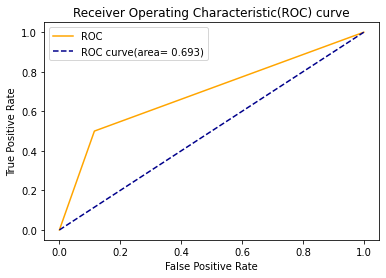

In [457]:
plt.plot(fpr1,tpr1,color="orange",label="ROC")
plt.plot([0,1],[0,1],color="darkblue",linestyle="--",label="ROC curve(area= %0.3f)" % auc1) #%f - formateted string -- 0.3 - upto 3 decimal places 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic(ROC) curve")
plt.legend()
plt.show()

In [458]:
#logist regression task 

https://archive.ics.uci.edu/ml/datasets/Activity+Recognition+system+based+on+Multisensor+data+fusion+%28AReM%29#
    
Task Logistic Regression
~~~~~~~~~~~~~~~~~~~~~~~~~~~
1. WAP to read folder name and make a label in the csv with folder name
2. Remove unneccesarry info in Automated way
3. No other algorithm must be used other than Logistic Regression
4. Try to utilize multiple solvers and make multiple models
5. Provide the best models
6. EDA and all must be done accordingly
Note: No manual approaches will be appreciated


SyntaxError: invalid syntax (<ipython-input-458-55a8d935859c>, line 3)

In [ ]:
a = 10
print("nikita score is %f" %a)